# Simulating a simple two level system in QuTiP


Any two level system's hamiltonian can be mapped to a linear combination of Sigma operators and the Identity.


$H = \overrightarrow{n} \overrightarrow{\sigma} + a I$

where $\overrightarrow{n}$ can be rappresented in the Bloch's sphere

In [11]:
# from qutip.ipynbtools import version_table; version_table()
from qutip import basis, sigmax, sigmaz, sigmay, identity, Bloch
from qutip import mesolve, Options
from math import pi
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D

from IPython.display import display, display_latex
from IPython.display import HTML

# Define constants
hbar = 1.0  # reduced Planck's constant [a.u.] 
w = 2.0 * pi  # Frequency of the harmonic oscillator [Rad/s]
m = 1.0     # Mass of the harmonic oscillator [a.u.]

In [4]:
# hamiltonia for a two-level system
n1 = 1.0  # Coefficient for sigmaz
n2 = 0.5  # Coefficient for sigmax
n3 = 0.5  # Coefficient for sigmay
n4 = 0.5  # Coefficient for identity
H2 = n1 * sigmaz() + n2 * sigmax() + n3 * sigmay() + n4 * identity(2)

display(H2)

Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=CSR, isherm=True
Qobj data =
[[ 1.5+0.j   0.5-0.5j]
 [ 0.5+0.5j -0.5+0.j ]]

c:\Users\yehan\Documents\Programming\Quantum-Simulations\.venv\Lib\site-packages\qutip\solver\options.py:16: FutureWarning: Dedicated options class are no longer needed, options should be passed as dict to solvers.
  warnings.warn(


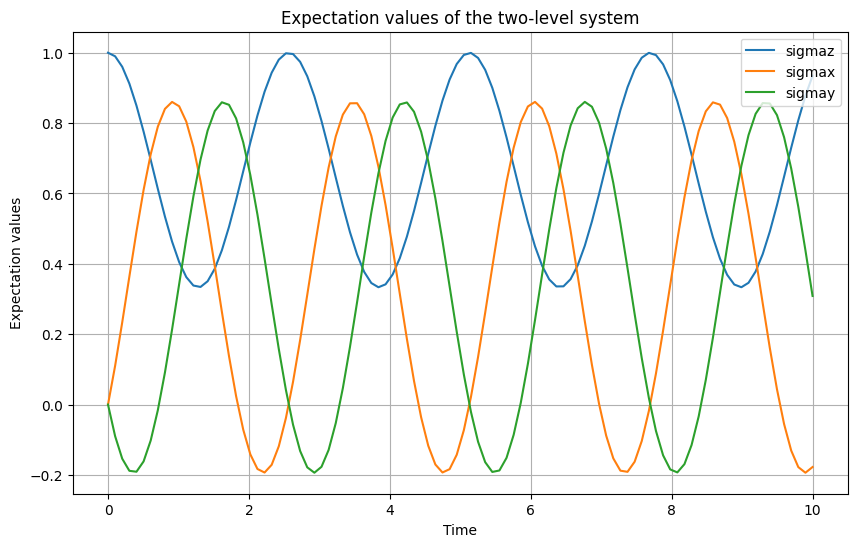

In [5]:
psi0 = basis(2, 0)  # Initial state |0> of the two-level system

tlist = np.linspace(0, 10, 100)  # Time list for the simulation

output = mesolve(H2, psi0, tlist, e_ops=[sigmaz(), sigmax(), sigmay()], options=Options(nsteps=1000))

plt.figure(figsize=(10, 6))
plt.title("Expectation values of the two-level system")
plt.plot(tlist, output.expect[0], label="sigmaz")
plt.plot(tlist, output.expect[1], label="sigmax")
plt.plot(tlist, output.expect[2], label="sigmay")
plt.xlabel("Time")
plt.ylabel("Expectation values")
plt.legend(loc="upper right")
plt.grid()
plt.show()

In [32]:
# Create a 3D plot of a sphere
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')

b = Bloch(fig=fig, axes=ax)

def update(frame):
    b.clear()
    b.add_states(output.states[frame])
    b.render()

def init():
    b.clear()
    b.render()
    # Set labels and title
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('3D Sphere')


ani = animation.FuncAnimation(fig, update, frames=len(output.states), init_func=init, blit=False, interval=100, repeat=True)
ani.save('bloch_sphere.gif', writer='Pillow', fps=10)

# Display the animation in Jupyter Notebook
HTML(ani.to_jshtml())

MovieWriter imagemagick unavailable; using Pillow instead.
